In [4]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
def plot_train_pred(x_train, y_train, y_pred):

    plt.scatter(x_train, y_train, marker = 'x', c = 'red', label = "Training Data")
    plt.plot(x_train, y_pred, c = 'blue', label = 'Predictions')
    plt.legend()

In [3]:
def array_sum(x):
    
    sum = np.sum(x)

    return sum

In [4]:
def compute_model_output(x, w, b):

    fwb = np.zeros(len(x))

    fwb = np.multiply(w, x)

    fwb += b

    return fwb

In [5]:
def compute_cost(x, y, w, b):

    m = len(x)

    fwb = compute_model_output(x, w, b)

    cost = (fwb - y)

    total_cost = array_sum(cost)        

    total_cost = total_cost.__pow__(2)

    total_cost = total_cost / ( 2 * m )

    return total_cost


In [6]:
def compute_gradient(x, y, w, b):

    m = len(x)

    dw = 0
    db = 0

    fwb = compute_model_output(x, w, b)

    cost = fwb - y

    dw = cost * x
    dw = array_sum(dw)

    db = cost
    db = array_sum(db)

    dw /= m
    db /= m

    return dw, db

In [7]:
def compute_gradient_descent(x, y, w, b, alpha):

        
    dw, db = compute_gradient(x, y, w, b)
    w = w - ( alpha * dw )
    b = b - ( alpha * db )

    return w, b

In [8]:
# x_train = np.array([0, 5, 10])
# y_train = np.array([5, 10, 15])

x_train = np.arange(0, 100, 5)
y_train = np.arange(5, 105, 5)

x_train, y_train

(array([ 0,  5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80,
        85, 90, 95]),
 array([  5,  10,  15,  20,  25,  30,  35,  40,  45,  50,  55,  60,  65,
         70,  75,  80,  85,  90,  95, 100]))

In [75]:
# Creating a model

def train_model(x,  y, epoch, alpha):

    w = 0
    b = 0    
    cost_history = []
    epochs_history = []
    predictions = np.zeros([epoch, len(x)])

    for i in range(epoch):

        epochs_history.append(i)
        y_pred = compute_model_output(x, w, b) 
        cost = compute_cost(x, y, w, b)
        w, b = compute_gradient_descent(x, y, w, b, alpha)
        cost_history.append(cost)
        predictions[i] = y_pred

        print("--- Cost = ", cost, "--- w = ", w, "--- b = ", b, "--- remaining = ", epoch - (i + 1))

    return y_pred, cost_history, epochs_history, predictions, w, b

In [69]:
epochs = 100000

y_pred, cost_history, epochs_history, predictions, w, b = train_model(x_train, y_train, epochs, 0.0001)

--- Cost =  3781.25 --- w =  0.0825 --- b =  0.0027500000000000003 --- remaining =  99999
--- Cost =  3287.304404999999 --- w =  0.1591156875 --- b =  0.0053141 --- remaining =  99998
--- Cost =  2859.536383878169 --- w =  0.23026673804062497 --- b =  0.007705558293125 --- remaining =  99997
--- Cost =  2488.9689400224984 --- w =  0.2963428954490709 --- b =  0.009936687576704281 --- remaining =  99996
--- Cost =  2167.850915484748 --- w =  0.357706106601277 --- b =  0.0120189223931862 --- remaining =  99995
--- Cost =  1889.4890120382624 --- w =  0.41469250393055135 --- b =  0.013962881761094009 --- remaining =  99994
--- Cost =  1648.1028728616388 --- w =  0.4676142465415371 --- b =  0.01577842733907416 --- remaining =  99993
--- Cost =  1438.7000560005313 --- w =  0.5167612300139397 --- b =  0.017474717441621792 --- remaining =  99992
--- Cost =  1256.9681664191103 --- w =  0.5624026742612028 --- b =  0.019060257202346265 --- remaining =  99991
--- Cost =  1099.1817892011807 --- w = 

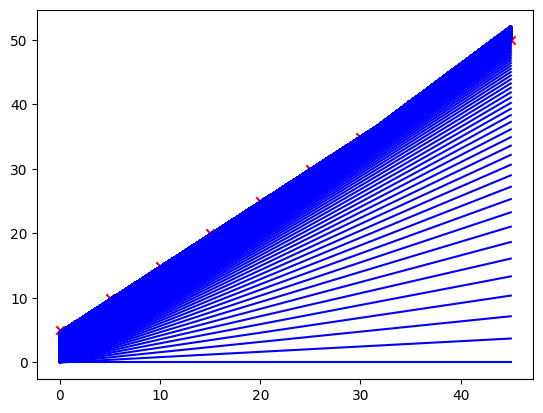

In [70]:
for i in range(epochs):

    plt.plot(x_train, predictions[i], c = 'blue', label = "predictions")

plt.scatter(x_train, y_train, marker = 'x', c = 'red', label = 'Training Data')

plt.show()

In [43]:
y_pred

array([1.90602572e-02, 2.83107363e+00, 5.64308700e+00, 8.45510037e+00,
       1.12671137e+01, 1.40791271e+01, 1.68911405e+01, 1.97031539e+01,
       2.25151672e+01, 2.53271806e+01])

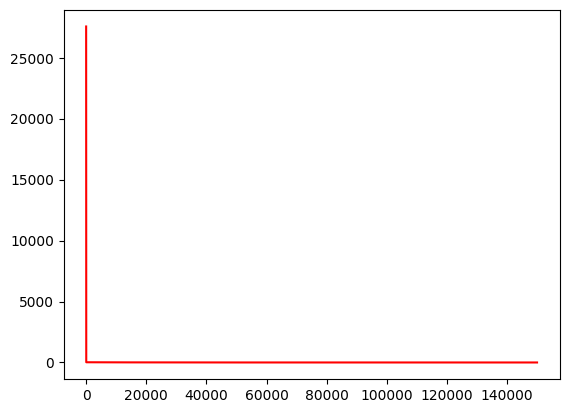

In [12]:
plt.plot(epochs_history, cost_history, c = 'red')

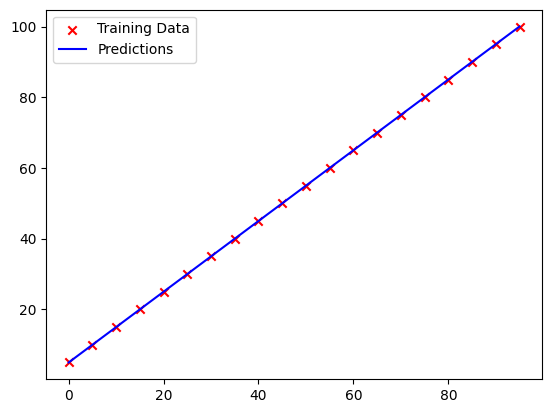

In [13]:
plot_train_pred(x_train, y_train, y_pred)

In [71]:
# Now Test model on unseen data


x_test = np.arange(200, 400, 5)
y_test = np.arange(205, 405, 5)

In [72]:
y_pred = compute_model_output(x_test, w, b)

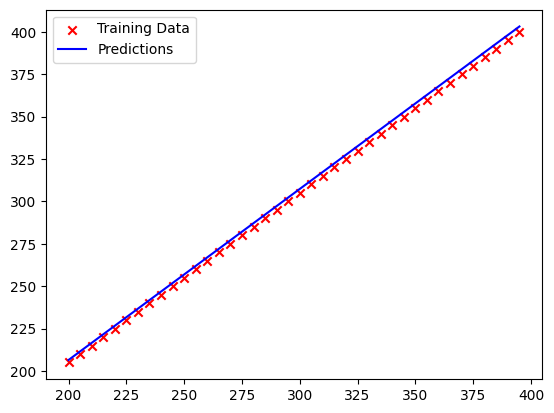

In [73]:
plot_train_pred(x_test, y_test, y_pred)